# Project description

## **Data for the project**

We will be using the shapefile dataset from Analyze Boston to create a shapefile to analyze the data of flood zone and sewer system in Boston.

Each dataset in Analyze Boston has its own resourceID and is in a pattern of "xxxxxxxx-xxxx-xxxx-xxxx-xxxxxxxxxxxx," which we can find from the url of the Analyze Boston.
Thus, we will first make a disctionary that takes necessary resourceID's as elements and the string of description of each resourceID's as keys.

We will be using dataset of:
- CANOPY CHANGE ASSESSMENT: 2014-2019 TREE CANOPY CHANGE
- HYDROGRAPHY (LINE)
- HYDROGRAPHY (POLYGON)
- 9INCH SEA LEVEL RISE 1PCT ANNUAL FLOOD
- 9INCH SEA LEVEL RISE 10PCT ANNUAL FLOOD
- 21INCH SEA LEVEL RISE 1PCT ANNUAL FLOOD
- 21INCH SEA LEVEL RISE 10PCT ANNUAL FLOOD
- 36INCH SEA LEVEL RISE 1PCT ANNUAL FLOOD
- 36INCH SEA LEVEL RISE 10PCT ANNUAL FLOOD
- City of Boston Boundary

In [2]:
# This is the function that forms the dictionary of resourceID's with keys that describes which resourceID connects to which dataset.
def getSourceDict():
    source = {
        "CANOPY_CHANGE_ASSESSMENT: 2014-2019 TREE CANOPY CHANGE": "0",
        "HYDROGRAPHY_LINE": "6",
        "HYDROGRAPHY_POLYGON": "5",
        "9INCH_SEA_LEVEL_RISE_1PCT_ANNUAL_FLOOD": "7",
        "9INCH_SEA_LEVEL_RISE_10PCT_ANNUAL FLOOD": "6",
        "9INCH_SEA_LEVEL_RISE_HIGH_TIDE": "8",
        "21INCH_SEA_LEVEL_RISE_1PCT_ANNUAL_FLOOD": "1",
        "21INCH_SEA_LEVEL_RISE_10PCT_ANNUAL_FLOOD": "0",
        "21INCH_SEA_LEVEL_RISE_HIGH_TIDE": "2",
        "36INCH_SEA_LEVEL_RISE_1PCT_ANNUAL_FLOOD": "4",
        "36INCH_SEA_LEVEL_RISE_10PCT_ANNUAL_FLOOD": "3",
        "36INCH_SEA_LEVEL_RISE_HIGH_TIDE": "5",
        "City of Boston Boundary": "9"
    }
    return source

## **Requests, matplotlib, and geopandas library**

Instead of manually add query, we will use requests (HTTP) library to directly access to the dataset.
Geopandas library is used to pull the dataset in shapefile format (.shp).
Matplotlib library is used to plot the dataset we pull in shapefile format in python.

For this example, I am using Atom to run the code, so that when I install the matplotlib and geopandas, I go to C:\Users\*user_name*\.atom directory to install the needed libraries.

In [3]:
import requests
import matplotlib.pyplot as plt
import geopandas as gpd
import json
from shapely.geometry import Point, Polygon, LineString

**Note:**
To install matplotlib outside the Jupyter notbook, open the window command prompt and go to "C:\Users\*user_name*\.atom" directory and type "pip3 install matplotlib".

C:\Users\*user_name*\.atom>pip3 install matplotlib

**If we use Anaconda to run the python code, matplotlib will be already installed.**

To install geopandas in Anaconda, open the Anaconda command prompt and type "conda install geopandas".



**Example queries using requests:**

r = requests.get('--url address of the source page from Analyze Boston--')

## **Helping functions**

As a helping function, we will make a function to convert from the name of the source to resourceID, and a function to create a list of srouces we are using in the dictionary.

In [4]:
# fromNametoID function takes a string of name of the source as input. It searches the key in the source dictionary that is the same 
# as the input. It will return the resourceID of the found key.
def fromNametoID(sourceName):
    ID = getSourceDict()[sourceName]
    
    return ID

# sourceList function takes no input. It will iterate through the keys in the source dictionary and return the list of keys (strings)
# in the dictionary (names of sources).
def sourceList():
    srcList = []
    dic = getSourceDict()
    for key in dic:
        srcList.append(key)
        
    return srcList

In [5]:
# For the example, we will use "HYDROGRAPHY_LINE" dataset
filename = "HYDROGRAPHY_LINE"

# We are finding the resourceID of "HYDROGRAPHY_LINE" from the dataset dictionary
print(fromNametoID(filename))

6


## **Accessing datasets**

Since the hydrography and the sea level rise datasets are in the form of feature layout, they have specific format of API where we can retrieve the dataset in JSON file.

 **API format for hydrography**

https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/(==resourceID==)

 **API format for sea level rise**

https://services.arcgis.com/sFnw0xNflSi8J0uh/ArcGIS/rest/services/Climate_Ready_Boston_Sea_Level_Rise_Inundation/FeatureServer/(==resourceID==)

**API format for canopy change assessment**

https://tiles.arcgis.com/tiles/sFnw0xNflSi8J0uh/arcgis/rest/services/Canopy_Change_Assessment_2014_2019_Tree_Canopy_Change/MapServer/(==resourceID==)

**Using query to convert the dataset from the html format to json format**

To convert the dataset from the HTML format to json format, we need to make a query "?f=json"

For example, https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/(==resourceID==)?f=json


In [6]:
# For hydrography
def hydro_data(resourceID):
    result = requests.get("https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/"+resourceID+"?f=json")
    return result.json()
    
# For sea level rise
def sea_level_data(resourceID):
    result = requests.get("https://services.arcgis.com/sFnw0xNflSi8J0uh/ArcGIS/rest/services/Climate_Ready_Boston_Sea_Level_Rise_Inundation/FeatureServer/"+resourceID+"?f=json")
    return result.json()

# For canopy change assessment
def canopy_change_data(resourceID):
    result = requests.get("https://tiles.arcgis.com/tiles/sFnw0xNflSi8J0uh/arcgis/rest/services/Canopy_Change_Assessment_2014_2019_Tree_Canopy_Change/MapServer/"+resourceID+"?f=json")
    return result.json()

# For Boston Boundary
def boston_data(resourceID):
    result = requests.get("https://gis.cityofboston.gov/arcgis/rest/services/Planning/OpenData/MapServer/"+resourceID+"?f=json")
    return result.json()

## **Getting fields from the data**

From the dataset we retrieved, we will take the fields of each dataset. We will continue to use the HYDROGRAPHY_LINE dataset as an example to take the fields from the json format of the data.

In [7]:
# data_fields function takes the json returned from the query as an input. It will return the fields of the data in json with
# types and names.
def hydro_data_fields(rejson):
    return rejson['fields'][1]['domain']['codedValues']

def sea_level_data_fields(rejson):
    return rejson

def canopy_change_data_fields(rejson):
    return rejson

def boston_fields(rejson):
    return rejson['fields']

In [8]:
# Check if we are using the HYDROGRAPHY_LINE data as an example
print(filename)

# Get the resourceID from the name of the data
resourceID = fromNametoID(filename)
print(resourceID)

# Retrieve the HYDROGRAPHY_LINE data by calling appropriate function call
dataset = hydro_data(resourceID)

# From the data, retrieve the fields of the dataset
fields = hydro_data_fields(dataset)

# Checking the fields of the dataset
for i in range(len(fields)):
    print(fields[i])

HYDROGRAPHY_LINE
6
{'name': 'Stream', 'code': 'STREAM'}
{'name': 'Uncovered ditch, channel, or swale', 'code': 'OPEN-CULVERT'}
{'name': 'Sewer or drain crossing under surface', 'code': 'COVERED-CULVERT'}


## **Making query on dataset to retrieve actual data records**

To take the actual data from the dataset, we need to make a query on the dataset. There are specific form of HTML that makes the query on the dataset. We will continue on the HYDROGRAPHY_LINE dataset for the example.

In order to retrieve every data, we will make a condition "where 1=1." Since 1=1 is always true, we will get all the data from the dataset (for HYDROGRAPHY_LINE there are 1469 results in total).

Since we want to specify which fields that each data are classified into, we will also take "out fields = \*." This means that we will include the fields of the each data in each retrieved data.

Thus, the form of the query will be:

**Format for hydrography data**

https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/(==resourceID==)/query?where=1%3D1&text=&objectIds=&time=&geometry=&geometryType=esriGeometryEnvelope&inSR=&spatialRel=esriSpatialRelIntersects&relationParam=&outFields=*&returnGeometry=true&maxAllowableOffset=&geometryPrecision=&outSR=&returnIdsOnly=false&returnCountOnly=false&orderByFields=&groupByFieldsForStatistics=&outStatistics=&returnZ=false&returnM=false&gdbVersion=&returnDistinctValues=false&f=html

**Format for sea level rise data**



**Format for canopy change data**








*For more details on the query to test and visualize it for better understanding, visit:*

***for hydrography***

*https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/(==resourceID==)/query*

***for sea level rise***

*https://services.arcgis.com/sFnw0xNflSi8J0uh/ArcGIS/rest/services/Climate_Ready_Boston_Sea_Level_Rise_Inundation/FeatureServer/(==resourceID==)/query*

***for canopy change***

*https://tiles.arcgis.com/tiles/sFnw0xNflSi8J0uh/arcgis/rest/services/Canopy_Change_Assessment_2014_2019_Tree_Canopy_Change/MapServer/(==resourceID==)/query*

***for Boston Boundary***

*https://gis.cityofboston.gov/arcgis/rest/services/Planning/OpenData/MapServer/(==resourceID==)/query*

In [9]:
# Function that returns the HTML for the query on getting actual data from the dataset
def hydro_data_query(resourceID):
    result = requests.get("https://gis.cityofboston.gov/arcgis/rest/services/EnvironmentEnergy/OpenData/MapServer/"+resourceID+"/query?where=1%3D1&text=&objectIds=&time=&geometry=&geometryType=esriGeometryEnvelope&inSR=&spatialRel=esriSpatialRelIntersects&relationParam=&outFields=*&returnGeometry=true&maxAllowableOffset=&geometryPrecision=&outSR=&returnIdsOnly=false&returnCountOnly=false&orderByFields=&groupByFieldsForStatistics=&outStatistics=&returnZ=false&returnM=false&gdbVersion=&returnDistinctValues=false&f=json")
    result = result.json()['features']
    return result

def sea_level_data_query(resourceID):
    return Null

def canopy_change_data_query(resourceID):
    return Null
    
def boston_data_query(resourceID):
    result = requests.get("https://gis.cityofboston.gov/arcgis/rest/services/Planning/OpenData/MapServer/"+resourceID+"/query?where=1%3D1&text=&objectIds=&time=&geometry=&geometryType=esriGeometryEnvelope&inSR=&spatialRel=esriSpatialRelIntersects&relationParam=&outFields=*&returnGeometry=true&maxAllowableOffset=&geometryPrecision=&outSR=&returnIdsOnly=false&returnCountOnly=false&orderByFields=&groupByFieldsForStatistics=&outStatistics=&returnZ=false&returnM=false&gdbVersion=&returnDistinctValues=false&f=json")
    result = result.json()['features']
    return result

In [29]:
# Getting actual records of HYRDOGRAPHY_LINE
hydro_metadata = hydro_data_query(resourceID)

# print(hydro_metadata)

## **Formatting and sorting data from JSON format to geoJSON format** ##

With the metadata of the dataset in json format, we want to change the format into geojson format so that we can use it for geopandas to plot. The basic format of the geojson with featureCollection type is

{"type":"FeatureCollection", <br>
"features":[ <br>
"type":"Feature", <br>
"geometry": { <br>
"type":"Line", <br>
"coordinates":[coordinates], <br>
}, <br>
"properties": , <br>
}]}

Since JSON and geoJSON formats are in a similar format as dictionaries in python, we will reform the JSON data into geoJSON format using dictionaries.

In [32]:
# Initially creating an empty dictionary
hydro_geodata = {}

# Adding the metadata into the dictionaary in geoJSON format
content = {"type":"FeatureCollection","features": [{"type":"Feature","properties": hydro_metadata[i]['attributes'], "geometry": {"type": "MultiLineString","coordinates": hydro_metadata[i]['geometry']['paths'],}} for i in range(len(hydro_metadata))] }

hydro_geodata.update(content)

# print(hydro_geodata)

With the dictionary containing the data, we will convert the format to json by using dumps() from json library. Then, we will create a file and write the json format of the data.

In [33]:
# make the data in a json object
hydro_geodata = json.dumps(hydro_geodata, indent = 4)

print(hydro_geodata)

# write the json object in a file
with open ("hydro_line.json", "w") as outfile:
    outfile.write(hydro_geodata)

{
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {
                "OBJECTID": 1,
                "TYPE": "OPEN-CULVERT",
                "NAME": null,
                "Shape.STLength()": 5.38166597648238
            },
            "geometry": {
                "type": "MultiLineString",
                "coordinates": [
                    [
                        [
                            778685.5541070253,
                            2953840.1326034367
                        ],
                        [
                            778681.0511632711,
                            2953843.079776019
                        ]
                    ]
                ]
            }
        },
        {
            "type": "Feature",
            "properties": {
                "OBJECTID": 2,
                "TYPE": "OPEN-CULVERT",
                "NAME": null,
                "Shape.STLength()": 2.814825952253858
    

After writing the data into a file, we will read the JSON file using read_file() from geopandas library. We can check if the file is read into GeoDataFrame by calling head().

In [13]:
hydrography_line = gpd.read_file("hydro_line.json")

hydrography_line.head()

,OBJECTID,TYPE,NAME,Shape.STLength(),geometry
0,1,OPEN-CULVERT,None,5.381666,"MULTILINESTRING ((778685.55411 2953840.13260, ..."
1,2,OPEN-CULVERT,None,2.814826,"MULTILINESTRING ((767206.99832 2953657.71630, ..."
2,3,OPEN-CULVERT,None,41.064009,"MULTILINESTRING ((773867.43579 2960628.06194, ..."
3,4,OPEN-CULVERT,None,33.337803,"MULTILINESTRING ((774878.46362 2959167.62523, ..."
4,5,OPEN-CULVERT,None,9.924857,"MULTILINESTRING ((747572.37913 2955407.66064, ..."


We can now plot the data by simply calling plot() with aspect = 1.

<AxesSubplot:>

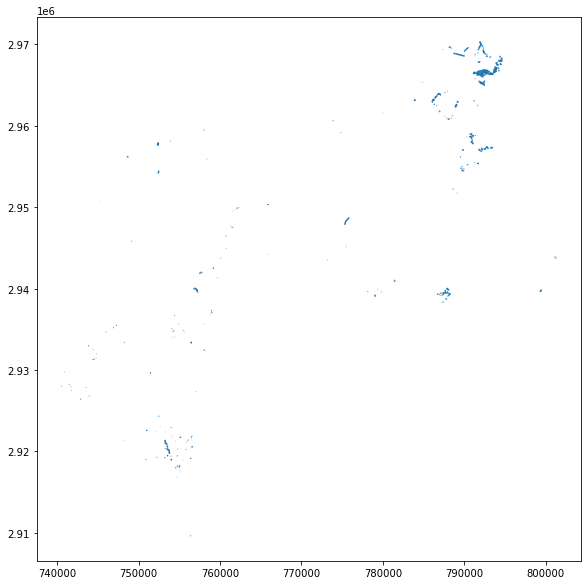

In [14]:
hydrography_line.plot(aspect=1, figsize=(15,10))

In [21]:
# outfile.close()

## **Plotting Boston map** 

To plot the Boston boundary map, we will repeat the similar process as we have done above for the HYDROGRAPHY_LINE.

We will first input the name of the file that has the data of the Boston boundary, and retrieve the resourceID of it.

In [15]:
bostonFile = "City of Boston Boundary"
print(fromNametoID(bostonFile))

9


We will then find the fields of the dataset.

In [16]:
# Check if the file name is Boston Boundary
print(bostonFile)

# Get resourceID
bostonID = fromNametoID(bostonFile)
print(bostonID)

bostonData = boston_data(bostonID)

bostonFields = boston_fields(bostonData)

# Checking the fields of the dataset
for i in range(len(bostonFields)):
    print(bostonFields[i])

City of Boston Boundary
9
{'name': 'OBJECTID', 'type': 'esriFieldTypeOID', 'alias': 'OBJECTID', 'domain': None}
{'name': 'BOSTON_LAN', 'type': 'esriFieldTypeDouble', 'alias': 'BOSTON_LAN', 'domain': None}
{'name': 'CITY', 'type': 'esriFieldTypeString', 'alias': 'CITY', 'length': 30, 'domain': None}
{'name': 'COUNTY', 'type': 'esriFieldTypeString', 'alias': 'COUNTY', 'length': 15, 'domain': None}
{'name': 'SHAPE', 'type': 'esriFieldTypeGeometry', 'alias': 'Shape', 'domain': None}
{'name': 'SHAPE.STArea()', 'type': 'esriFieldTypeDouble', 'alias': 'SHAPE.STArea()', 'domain': None}
{'name': 'SHAPE.STLength()', 'type': 'esriFieldTypeDouble', 'alias': 'SHAPE.STLength()', 'domain': None}


By making a query, we will pull the actual data record from the dataset.

In [34]:
# Getting actual records of Boston Boundary
boston_metadata = boston_data_query(bostonID)

# print(boston_metadata)

With the metadata, we will format the data into a geoJSON format and save it in a json file.

In [35]:
boston_geodata = {}

content = {"type":"FeatureCollection","features": [{"type":"Feature","properties": boston_metadata[0]['attributes'], "geometry": {"type": "Polygon","coordinates": boston_metadata[0]['geometry']['rings'],}}]}
                                                   
boston_geodata.update(content)

# print(boston_geodata)

In [19]:
boston_geodata = json.dumps(boston_geodata, indent = 4)

print(boston_geodata)

with open ("boston_polygon.json", "w") as boston_outfile:
    boston_outfile.write(boston_geodata)

{
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {
                "OBJECTID": 1,
                "BOSTON_LAN": 1,
                "CITY": " ",
                "COUNTY": " ",
                "SHAPE.STArea()": 1346516231.4473877,
                "SHAPE.STLength()": 816364.5953389249
            },
            "geometry": {
                "type": "Polygon",
                "coordinates": [
                    [
                        [
                            739829.49960953,
                            2928419.199905008
                        ],
                        [
                            743092.4003614485,
                            2932500.6996735483
                        ],
                        [
                            746890.4996014535,
                            2935898.6999409646
                        ],
                        [
                            747096.2995389849,
    

When we run the above cell, if we get an error message that states that "IOPub data rate exceeded. The notebook server will temporarily stop sending output," it means that we need to increase the NotebookApp.iopub_data_rate_limit value.

First, close the current prompt or type Ctrl+C to terminate the current jupyter notebook server.

Then, restart the jupyter notebook with the command:

*jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000

In [20]:
boston_polygon = gpd.read_file("boston_polygon.json")

boston_polygon.head()

,OBJECTID,BOSTON_LAN,CITY,COUNTY,SHAPE.STArea(),SHAPE.STLength(),geometry
0,1,1,,,1.346516e+09,816364.595339,"POLYGON ((739829.49961 2928419.19991, 743092.4..."


<AxesSubplot:>

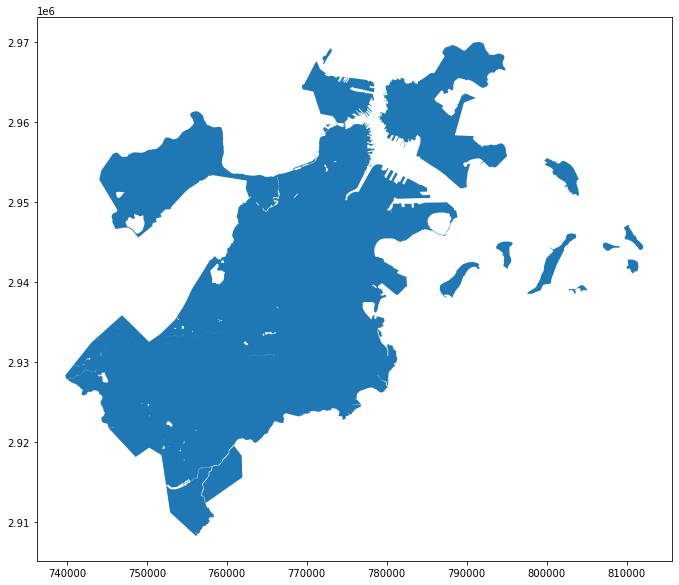

In [22]:
boston_polygon.plot(aspect=1, figsize=(15,10))

## **Plotting one data plot on top of other data plot**

For better visualization to compare different data sets, we will need to plot one data plot on top of other data plot. To do so, we first need to assign the base plot (the plot that goes under the other plot) into a variable, then plot the top plot (the plot that goes on top of the other plot) with the base plot assigned to "ax" value.

<AxesSubplot:>

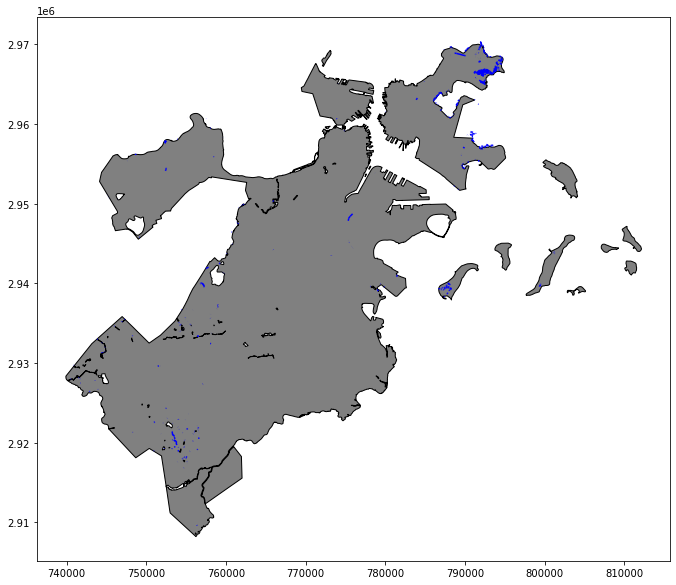

In [28]:
boston_map = boston_polygon.plot(aspect=1, color='gray', edgecolor='black', figsize=(15,10))

hydrography_line.plot(aspect=1, ax=boston_map, color='blue', figsize=(15,10))